<a href="https://colab.research.google.com/github/Leeeuijooo/YoloV5/blob/main/YoLoV5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Yolo v5 veichless Detection (Use My Data Set - Roboflow)
**20171491 이의주**



**환경**

1. GPU 
2. pytorch
3. train 파일명 변경 필요 (->export) 

**1. 데이터셋 다운로드**  [roboflow] (https://public.roboflow.com/ds/TWPmhdnT1N?key=CYVVLrqFxy)

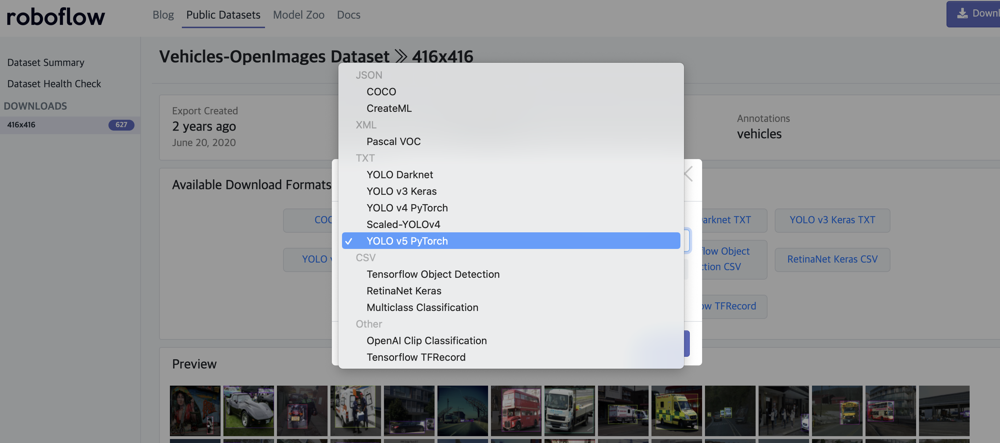

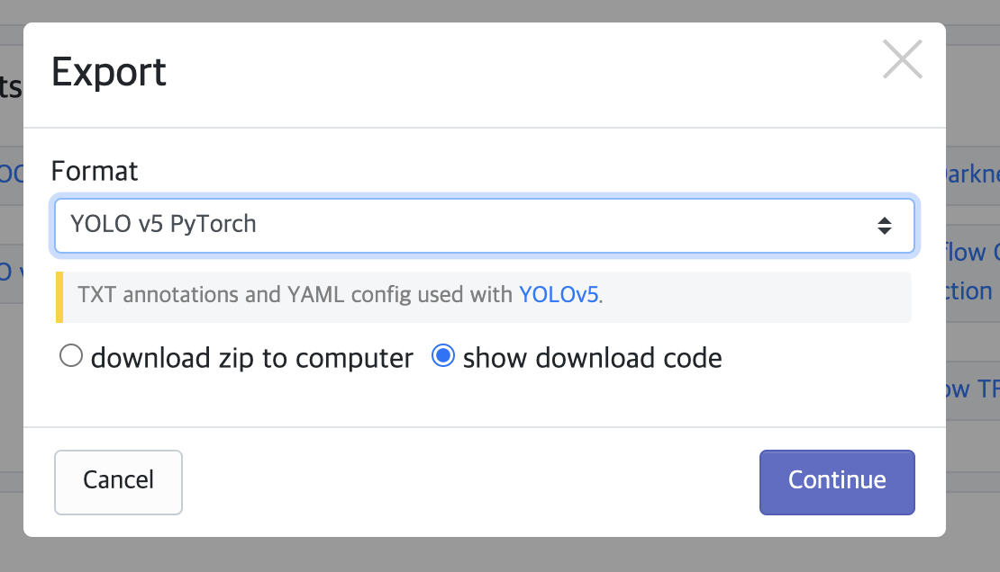

In [1]:
!curl -L "https://public.roboflow.com/ds/TWPmhdnT1N?key=CYVVLrqFxy" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   888  100   888    0     0   1744      0 --:--:-- --:--:-- --:--:--  1744
100 38.4M  100 38.4M    0     0  18.5M      0  0:00:02  0:00:02 --:--:-- 33.4M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg  
 extracting: test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg  
 extracting: test/images/00e481ea1a520175_jpg.rf.6e6a8b3b45c9a11d106958f88ff714ea.jpg  
 extracting: test/images/00e481ea1a520175_jpg.rf.MV6sZ8QCFwFeMYaI2tHm.jpg  
 extracting: test/images/08c8b73e0c2e296e_jpg.rf.7IkYAamjZhnwsoXSrwKt.jpg  
 extracting: test/images/08c8b73e0c2e296e_jpg.rf.effa65856584463c08848031cab357b9.jpg  
 extractin

# **2. Yolov5 의 깃허브에서 yolov5 가동을 위한 파일 클론**

# **-yolov5 디렉토리 생성**

In [2]:
%cd /content
!git clone https://github.com/ultralytics/yolov5.git

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 13472, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 13472 (delta 0), reused 1 (delta 0), pack-reused 13468
Receiving objects: 100% (13472/13472), 12.10 MiB | 23.55 MiB/s, done.
Resolving deltas: 100% (9396/9396), done.


# **yolov5에 필요한 패키지 설치**

In [3]:
%cd /content/yolov5/
%pip install -r requirements.txt    

/content/yolov5
     |████████████████████████████████| 596 kB 11.9 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


# **데이터셋 조정**

# 1. 데이터셋에 관한 정보인 data.yaml 파일을 들여다 보겠습니다.
# 2. 카테고리(콜론)은 5개('Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck')로 이루어져있습니다.
# 3. 경로가 roboflow에서 제공하는 디폴트 경로로 지정되있기 때문에 나중에 경로를 바꿔줄 것 입니다.

In [4]:
%cat /content/dataset/data.yaml

train: ../train/images
val: ../valid/images

nc: 5
names: ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']

# roboflow가 제공하는 데이터셋에는 train, valid, test 파일이 구성되어있는데 저는 train 데이터셋만을 이용하겠습니다.

In [5]:
import os
import shutil
file_path = "/content/dataset/test"
if os.path.exists(file_path) : 
    shutil.rmtree(file_path)

In [6]:
import os
import shutil
file_path = "/content/dataset/valid"
if os.path.exists(file_path) : 
    shutil.rmtree(file_path)

# train set 만을 이용하기 위해서 valid, test set을 삭제하겠습니다.

# 그리고 glob을 임포트하여 train(export) 이미지를 긁어 보고 그 이미지들이 몇장인지 파악해보겠습니다.

In [7]:
%cd / 
from glob import glob

img_list = glob('/content/dataset/export/images/*.jpg')
print(len(img_list))

/
878


# 878장이 존제하는것을 확인할 수 있습니다.
# 이제 사이킷런의 tran_test_split 을 import하여 train set 과 test셋을 나누겠습니다.
**이미지 리스트를 test size(val 이미지)는 0.2 , train size를 0.8 로 나누고 random_state를 2000으로 정해주었습니다.**

In [8]:
from scipy.sparse.construct import rand
from sklearn.model_selection import train_test_split

train_img_list , val_img_list = train_test_split(img_list, test_size=0.2, random_state=2000)
print(len(train_img_list), len(val_img_list))

702 176


# - train img = 702장의 이미지
# - val img (test)  = 176장의 이미지로 나눠진것을 볼 수 있습니다.

# 리스트 형태이기 때문에 join함수를 이용해 
# train set 과 val set을 txt의 형태로 리스트들을 저장합니다.

In [9]:
with open('content/dataset/train.txt', 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open('content/dataset/val.txt', 'w') as f:
  f.write('\n'.join(val_img_list) + '\n')



# 이미지 리스트들의 목록입니다.

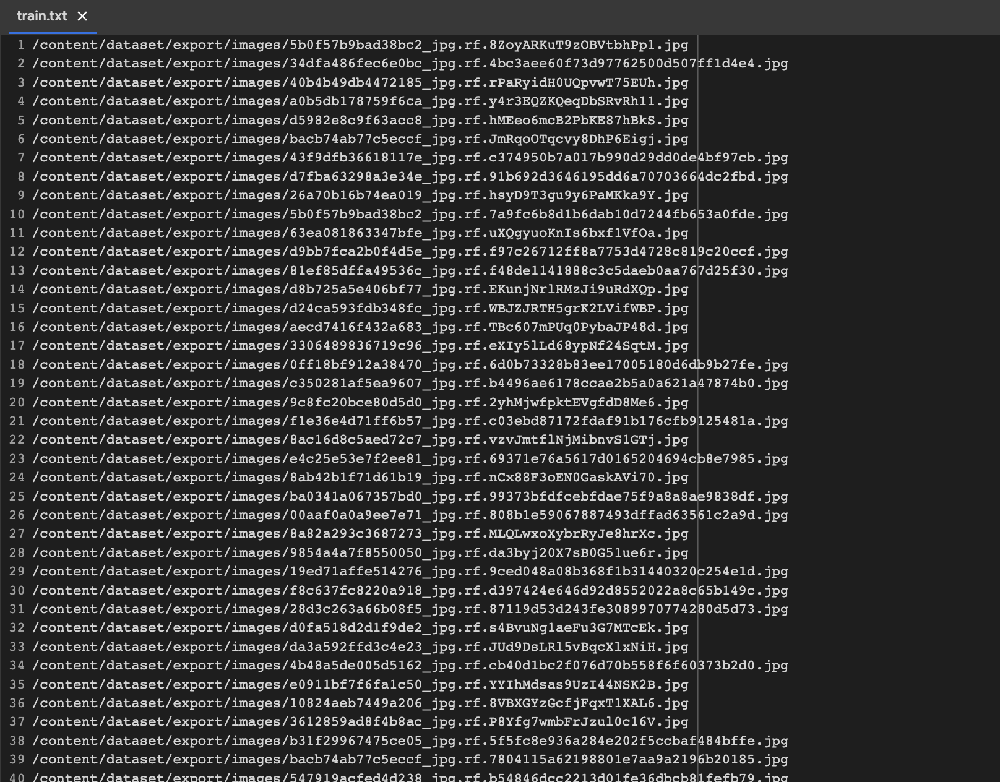

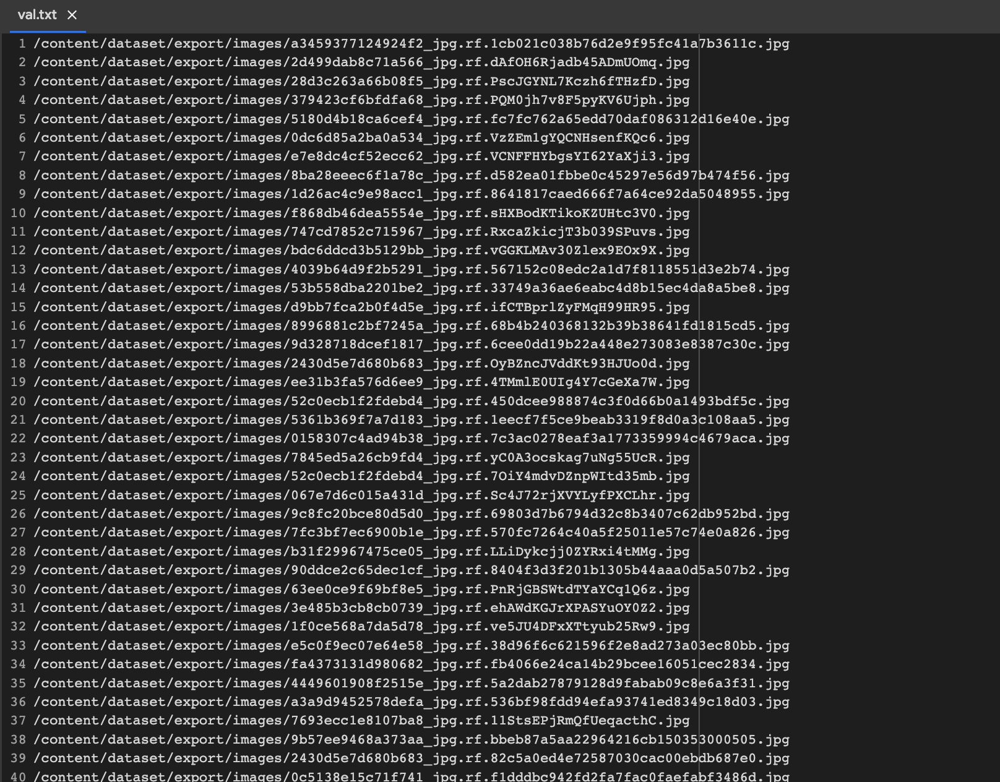

# 1. 위에서 data.yaml의 경로가 잘못되었다고 말했습니다. 
# data.yaml의 경로를 수정해주겠습니다.
# 2. yaml 패키지를 import하고 content/dataset/data.yaml을 로드하여 읽어주고, 
# 각각의 데이터셋에 txt파일(train.txt, val.txt)을 지정해줍니다.

In [10]:
import yaml
#초기의 data.yaml파일 읽어준다.
with open('/content/dataset/data.yaml', 'r') as f:
  data = yaml.safe_load(f)
#print 함수를 이용하여 초기의 data.yaml 파일을 보여줍니다.
print(data)

data['train'] = '/content/dataset/train.txt'
data['val'] = '/content/dataset/val.txt'
# 다시 수정된 data.yaml파일을 불러와줍니다.
with open('/content/dataset/data.yaml', 'w') as f:
  yaml.dump(data,f)
print(data)

{'train': '../train/images', 'val': '../valid/images', 'nc': 5, 'names': ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']}
{'train': '/content/dataset/train.txt', 'val': '/content/dataset/val.txt', 'nc': 5, 'names': ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']}


# train : ../train/images -> train: /content/dataset/train.txt
# val : ../valid/images -> val: /content/dataset/val.txt
# 으로 바뀐것을 확인할 수 있다.

# 모델 트레이닝
# train.py - yolov5의 train 시키는 파일 ( 파마미터들이 정의되어있고 우리는 이것을 조정할 수 있다.)
# *파라미터*
# - img : 416
# - batch : 16
# - epochs : 50
# - --cfg : yolov5s 이용 
# - weights : pre trained 된 yolov5s.pt 사용


In [11]:
%cd /content/yolov5

! python train.py --img 416 --batch 16 --epochs 50 --data /content/dataset/data.yaml --cfg ./models/yolov5s.yaml --weights yolov5s.pt --name car_detection_yolov5_results #cfg파일은 모델의 정의를 나타낸다

/content/yolov5
train: weights=yolov5s.pt, cfg=./models/yolov5s.yaml, data=/content/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=car_detection_yolov5_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-191-gd29df68 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_

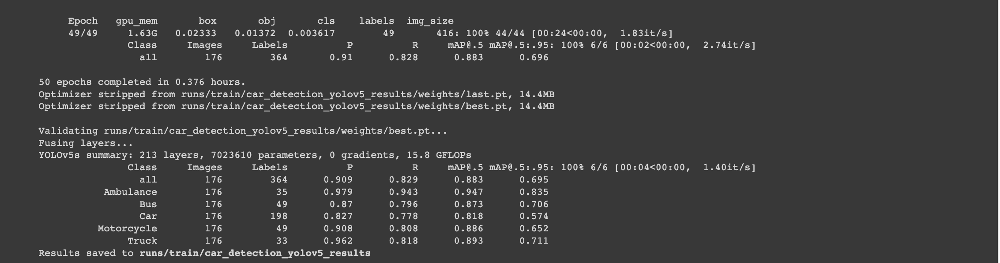

# 마지막 49에포크에서 정확도 91%를 얻었습니다.
# yolov5 summary 를 보시면 모든 클래스에서는 90%의 정확도를 보였고
# 특히 Ambulance 애서 97%의 매우 높은 정확도를 보였고
# Car에서는 82%의 낮은 정확도를 보여주었습니다. 
# 파라미터 조정을 통해 계속 정확도를 높여갈 생각입니다.

# content/yolov5/runs/car_detection_yolov5_results 경로로 들여다보면 아래와 같이 정확도와 예측한 이미지를 볼 수 있습니다.

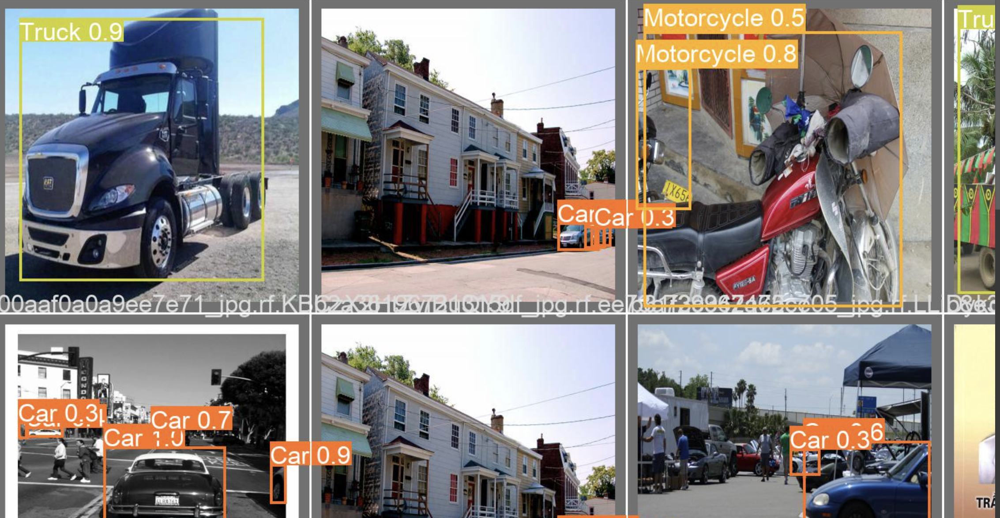

# **텐서보드**

In [12]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/

<IPython.core.display.Javascript object>

In [16]:
from IPython.display import Image
import os

val_img_path = val_img_list[4]

!python detect.py --weights /content/yolov5/runs/train/car_detection_yolov5_results/weights/best.pt --img 416 --conf 0.5 --source "{val_img_path}"

Image(os.path.join('/content/yolov5/inference/output', os.path.basename(val_img_path)))

detect: weights=['/content/yolov5/runs/train/car_detection_yolov5_results/weights/best.pt'], source=/content/dataset/export/images/5180d4b18ca6cef4_jpg.rf.fc7fc762a65edd70daf086312d16e40e.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-191-gd29df68 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/dataset/export/images/5180d4b18ca6cef4_jpg.rf.fc7fc762a65edd70daf086312d16e40e.jpg: 416x416 1 Truck, Done. (0.023s)
Speed: 0.5ms pre-process, 22.8ms inference, 1.7ms NMS per image at shape (1, 3, 416, 416)
Results saved to run

# 우수한 정확도를 보인 이미지를 하나 출력해봅니다.

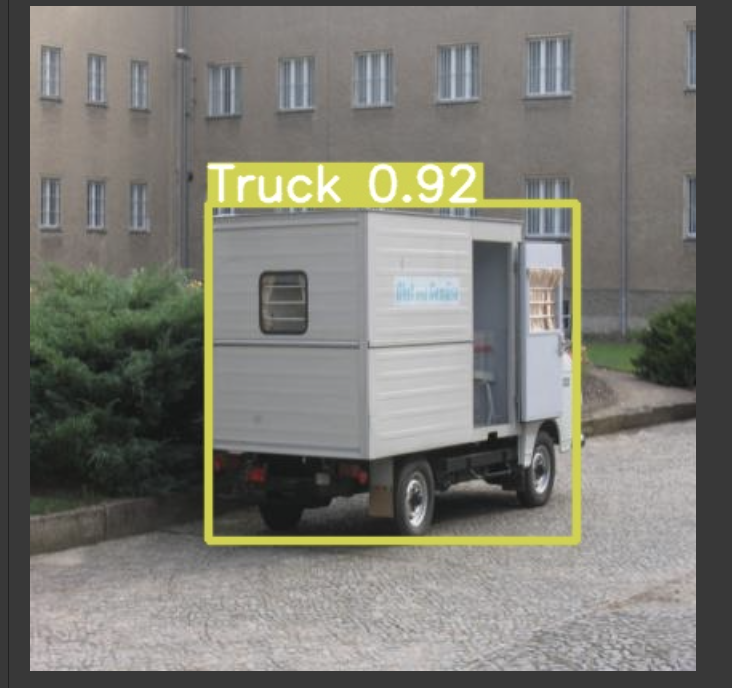